In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [40]:
def sift_pca(img1, img2):
    sift = cv2.xfeatures2d.SIFT_create()

    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    descriptors = np.vstack((des1, des2))

    pca = PCA(n_components=20)
    descriptors_pca = pca.fit_transform(descriptors)
    return des1, des2, kp1, kp2, descriptors_pca

In [41]:
def bf_matcher(img1, img2):
    des1, des2, kp1, kp2, descriptors_pca = sift_pca(img1, img2)
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches = bf.match(descriptors_pca[:len(des1)], descriptors_pca[len(des1):])

    good_matches = []
    for m in matches:
        if m.distance < 0.8 * min(m.queryIdx, m.trainIdx):
            good_matches.append(m)

    good_matches = sorted(good_matches, key=lambda x: x.distance)
    img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches[:10], img2, flags=2)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [48]:
def custom_matcher(img1, img2):
    des1, des2, kp1, kp2, descriptors_pca = sift_pca(img1, img2)
    matches = []
    for i, d1 in enumerate(descriptors_pca[:len(des1)]):
        distances = np.linalg.norm(d1-descriptors_pca[len(des1):], axis=1)
        min_idx = np.argmin(distances)
        min_dist = distances[min_idx]
        if min_dist < 0.8:
            matches.append(cv2.DMatch(i, min_idx, min_dist))
    img = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], img2, flags=2)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


In [37]:
def show_matches(matches):
    plt.figure(figsize=(15, 15))
    plt.imshow(matches)
    plt.show()

In [58]:
img1 = cv2.imread("images/3.jpg")
img2 = cv2.rotate(img1[300:500, 300:500], cv2.ROTATE_90_CLOCKWISE)

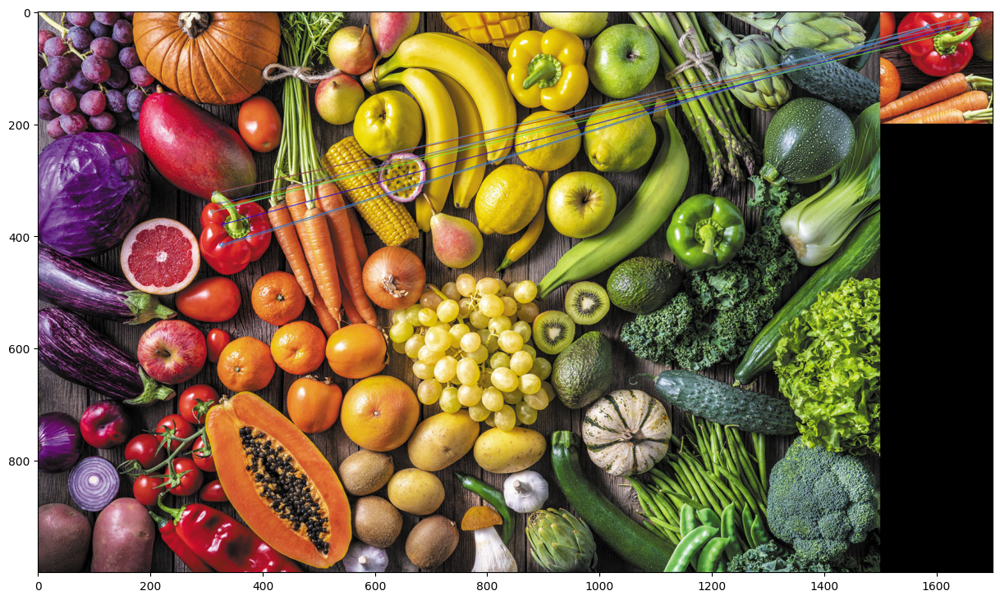

In [57]:
bf_match = bf_matcher(img1, img2)
show_matches(bf_match)

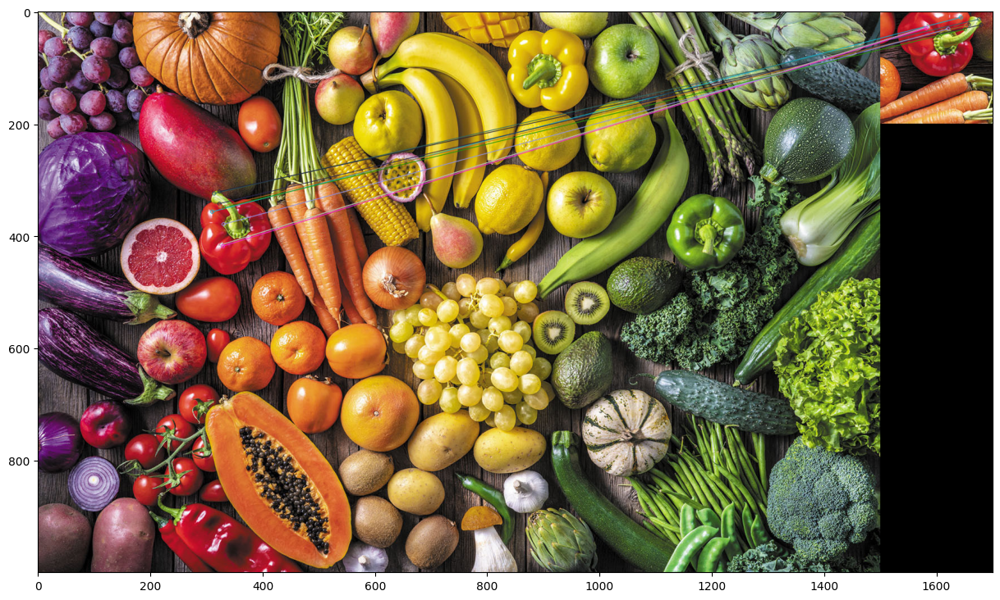

In [59]:
custom_match = custom_matcher(img1, img2)
show_matches(custom_match)

In [80]:
img_3 = cv2.imread("images/1.jpg")
img_4 = cv2.rotate(img_3[600:1300, 600:1300], cv2.ROTATE_90_CLOCKWISE)

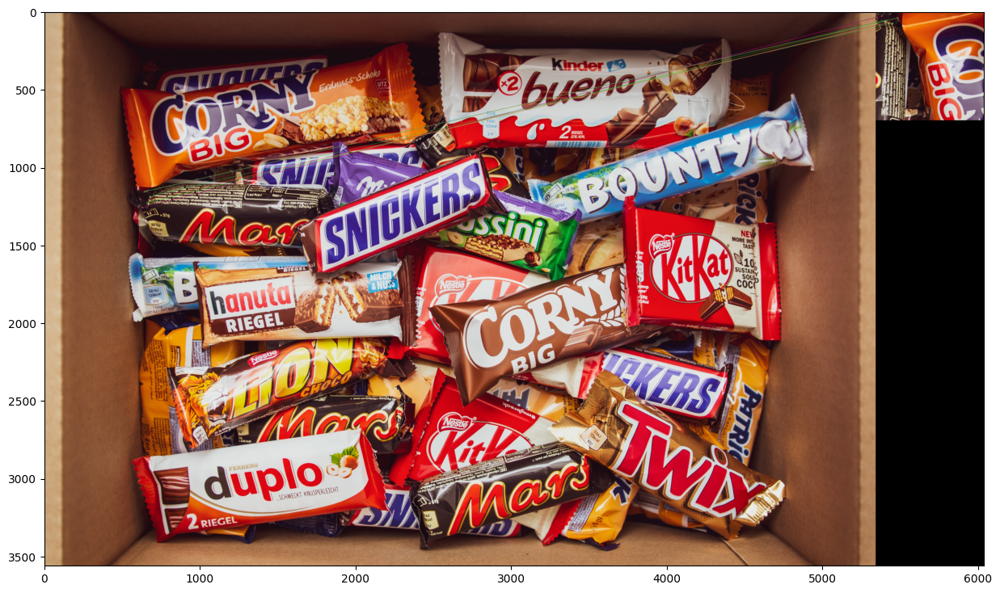

In [81]:
bf_match = bf_matcher(img_3, img_4)
show_matches(bf_match)

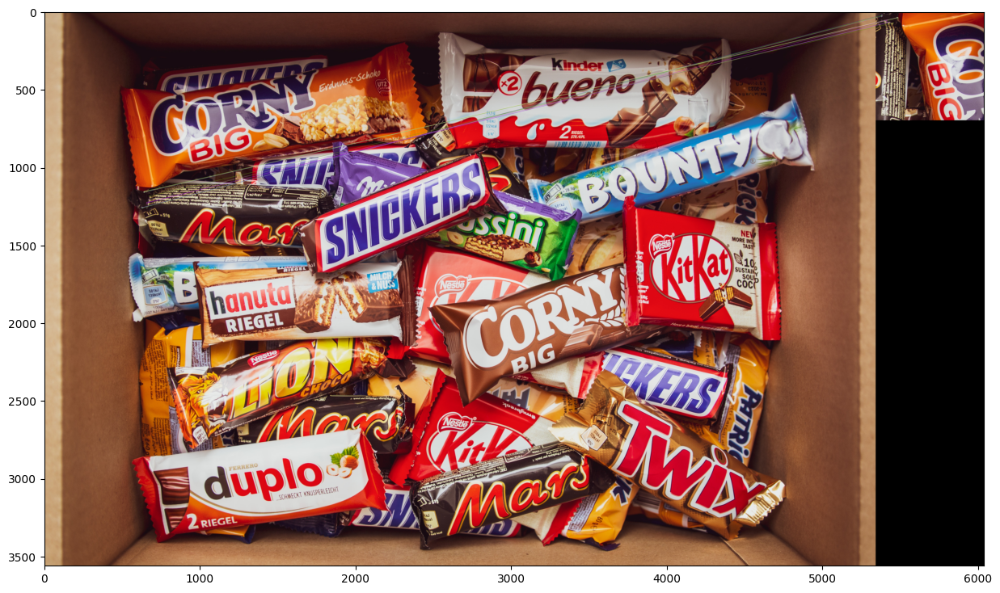

In [82]:
custom_match = custom_matcher(img_3, img_4)
show_matches(custom_match)

Додаткове завдання (оцінюється у додаткові бали) - в процесі порівняння дескрипторів
використати власну реалізацію алгоритму RANSAC.
Додаткові бали також надаються за написання власної функції побудови дексрипторів, без
використання Ope.CV

In [113]:
import random

def ransac(key_points_1, key_points_2, matches):

    threshold = 10
    best_inliers = []
    for i in range(1000):
        sample = random.sample(matches, 4)
        src_points = np.float32([key_points_1[m.queryIdx].pt for m in sample]).reshape(-1, 1, 2)
        dst_points = np.float32([key_points_2[m.trainIdx].pt for m in sample]).reshape(-1, 1, 2)
        H, _ = cv2.findHomography(src_points, dst_points, cv2.RANSAC, threshold)
        inliers = []
        for m in range(len(matches)):
            src_point = np.float32(key_points_1[matches[m].queryIdx].pt).reshape(-1, 1, 2)
            dst_point = np.float32(key_points_2[matches[m].trainIdx].pt).reshape(-1, 1, 2)
            dst_pt_transformed = cv2.perspectiveTransform(src_point, H)
            distance = np.linalg.norm(dst_pt_transformed - dst_point)
            if distance < threshold:
                inliers.append(matches[m])

        if len(inliers) > len(best_inliers):
            best_inliers = inliers

    return best_inliers

In [121]:
def ransac_matcher(img1, img2):
    des1, des2, kp1, kp2, descriptors_pca = sift_pca(img1, img2)

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    matches = bf.match(descriptors_pca[:len(des1)], descriptors_pca[len(des1):])
    inliers = ransac(kp1, kp2, matches)

    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, inliers[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    img_matches = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)

    return img_matches

In [ ]:
img1 = cv2.imread("images/3.jpg")
img2 = cv2.rotate(img1[300:500, 300:500], cv2.ROTATE_90_CLOCKWISE)

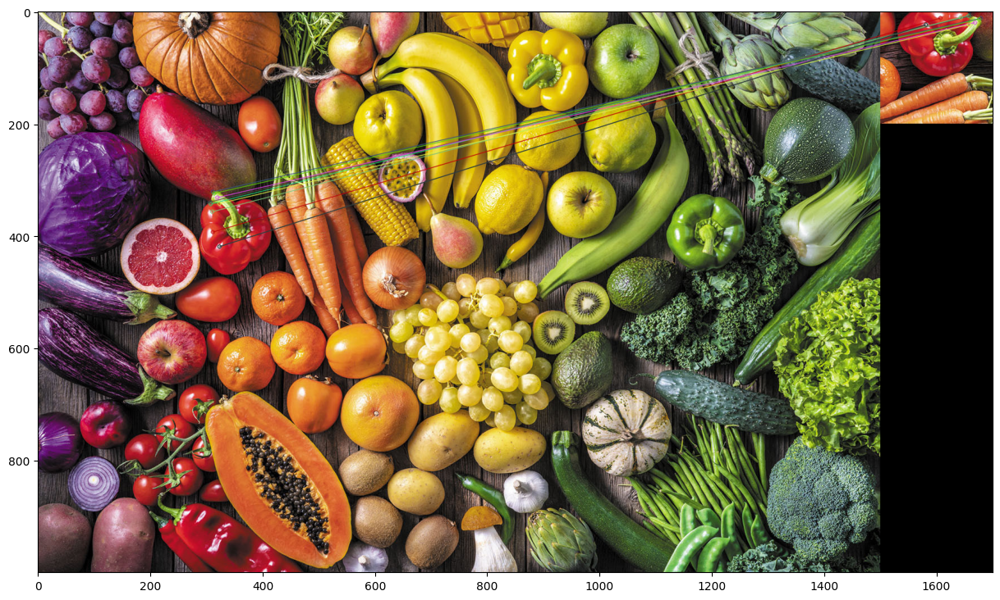

In [122]:
show_matches(ransac_matcher(img1, img2))

In [123]:
img_3 = cv2.imread("images/1.jpg")
img_4 = cv2.rotate(img_3[600:1300, 600:1300], cv2.ROTATE_90_CLOCKWISE)

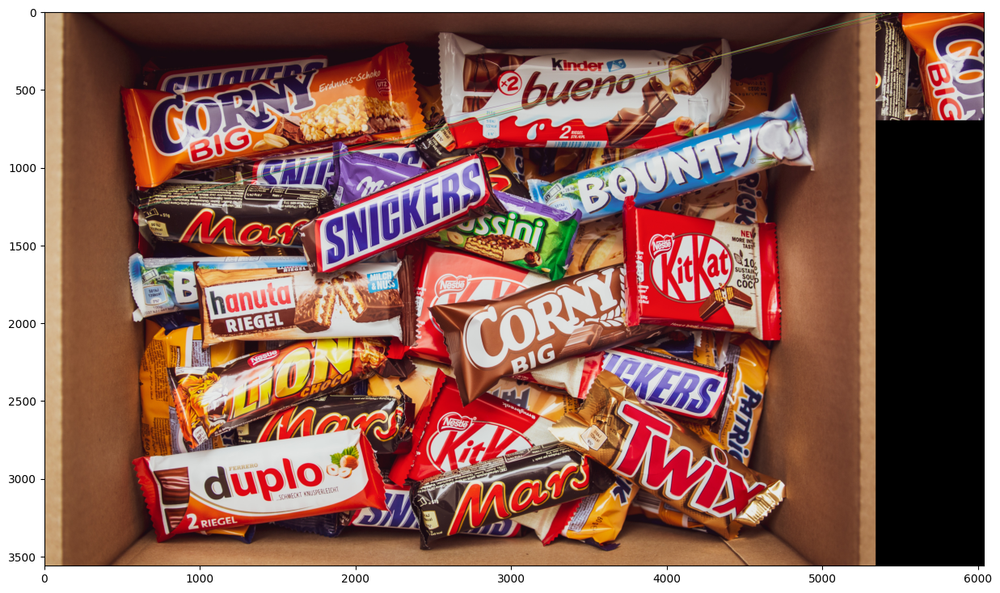

In [124]:
show_matches(ransac_matcher(img_3, img_4))